# Perturbation & sensitivity test results for dissolved Barium

* Regular case: 6-year spin-up, simulate from 20020101-20131231
* Perturbed case: Regular case * 1.1 to all depth (10% increase)

# Content
1. [**Import modules & tools**](#Import-modules-&-tools)
1. [**Domain averaged timeseries**](#Domain-averaged-timeseries)
1. [**View the result by regions**](#View-the-result-by-regions)
1. [**Result in depth**](#Result-in-depth)
1. [**Conclusions**](#Conclusions)

#Import modules & tools

In [1]:
import sys
sys.path.insert(0, '_libs/')
import NEMO_tools as Nts

In [2]:
import glob
import datetime
import scipy.io
import scipy.signal
import numpy as np
import netCDF4 as nc
import cartopy.feature
import cartopy.crs as ccrs # ccrs
#import NEMO_tools as Nts
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap, cm
% matplotlib inline

In [100]:
lnum=0
FName1 = '/ocean/yingkai/GEOTRACES/Simulations/SPIN06_SET02_1m_20020101_20131231_ptrc_T.nc'
FName2 = '/ocean/yingkai/GEOTRACES/Simulations/SET03_1m_20020101_20131231_ptrc_T.nc'
ptrc_obj1 = nc.Dataset(FName1)
ptrc_obj2 = nc.Dataset(FName2)
nav_lon = ptrc_obj1.variables['nav_lon'][:]
nav_lat = ptrc_obj1.variables['nav_lat'][:]
Ba1 = np.squeeze(ptrc_obj1.variables['Ba'][:, lnum, :, :]); Ba1[Ba1==0]=np.nan
Ba2 = np.squeeze(ptrc_obj2.variables['Ba'][:, lnum, :, :]); Ba2[Ba2==0]=np.nan

# Domain averaged timeseries

In [101]:
y = np.zeros([8, 144])

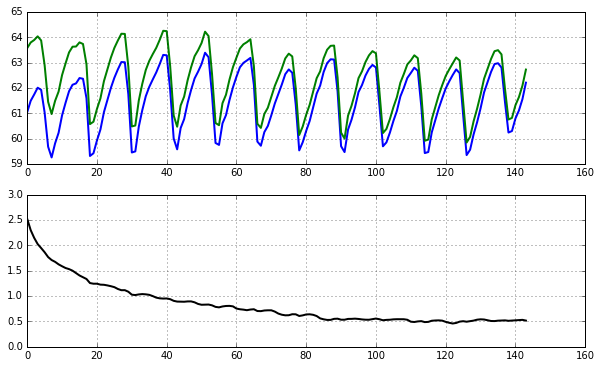

In [102]:
y[0, :] = np.nanmean(np.nanmean(Ba2, 1), 1)-np.nanmean(np.nanmean(Ba1, 1), 1)

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(np.nanmean(np.nanmean(Ba1, 1), 1), lw=2)
ax1.plot(np.nanmean(np.nanmean(Ba2, 1), 1), lw=2)
ax2.plot(np.nanmean(np.nanmean(Ba2, 1), 1)-np.nanmean(np.nanmean(Ba1, 1), 1), 'k-', lw=2)

# View the result by regions

In [5]:
from dateutil.relativedelta import relativedelta

base = datetime.datetime(2002, 1, 1)
date_list = [base + relativedelta(months=x) for x in range(144)]

In [6]:
rf_name=glob.glob('_data/Samples/STN-30p/runoff_id_modified.mat')
rf_obj=scipy.io.loadmat(rf_name[0])
rf_id=rf_obj['rf_id']
rf_lon=rf_obj['lon']
rf_lat=rf_obj['lat']
rf_id[rf_id==2]=0 # 0 is Central Arctic

In [7]:
Ba_temp = Ba1[0, :, :]
Class_interp = Nts.reporj_NEMOgrid(rf_lon, rf_lat, rf_id, nav_lon, nav_lat, method='nearest')
Class_range = Nts.reporj_NEMOgrid(rf_lon, rf_lat, rf_id, nav_lon, nav_lat, method='linear')
Class_interp[np.isnan(Class_range)] = np.nan
Class_interp[np.isnan(Ba_temp)] = np.nan
Class_masked = np.ma.masked_where(np.isnan(Class_interp), Class_interp)

In [8]:
regions=["Central Arctic",    \
        "Arctic Archipelago", \
        "Baffin Bay",         \
        "Barents Sea",        \
        "Beaufort Sea",       \
        "Bering Strait",      \
        "Chukchi Sea",        \
        "East Siberian Sea",  \
        "Foxe Basin",         \
        "Hudson Bay",         \
        "Hudson Strait",      \
        "Kara Sea",           \
        "Laptev Sea",         \
        "Norwegian Sea",      \
        "Greenland Sea",\
        "South Greenland Sea"]

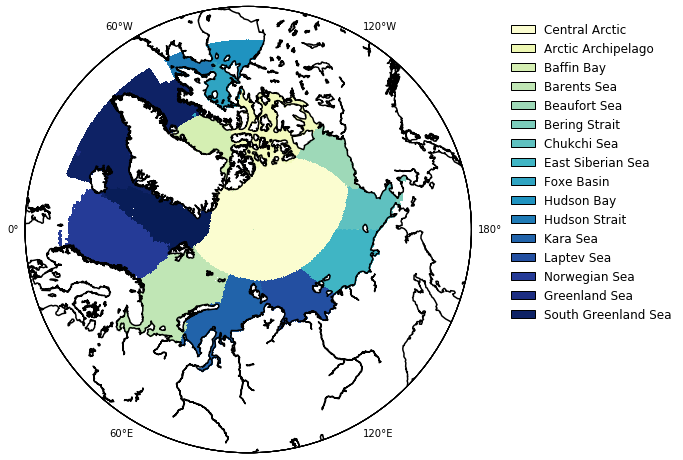

In [9]:
CMap=plt.cm.YlGnBu
var_name='Runoff Classification'
clev=np.array([0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17])-0.5
rf_id_masked=np.ma.masked_where(np.isnan(rf_id), rf_id)
#
fig, ax, proj = Nts.plot_Arctic_LandCover(nav_lon, nav_lat, 55, Class_masked, clev, regions, CMap, var_name)
#

fig.set_size_inches(8, 8)
fig.canvas.draw()

## Central Arctic

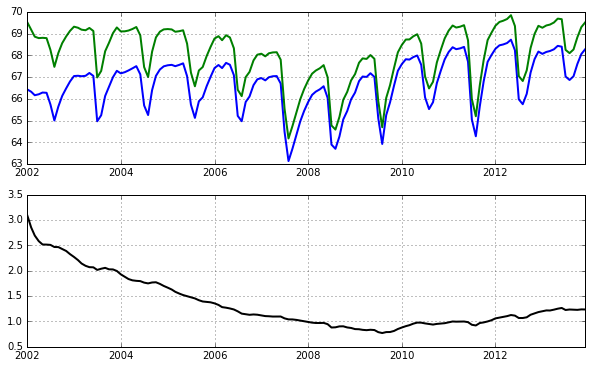

In [28]:
y1 = np.nanmean(Ba1[:, Class_interp==0], 1)
y2 = np.nanmean(Ba2[:, Class_interp==0], 1)
y[1, :] = y2-y1

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

## CAA

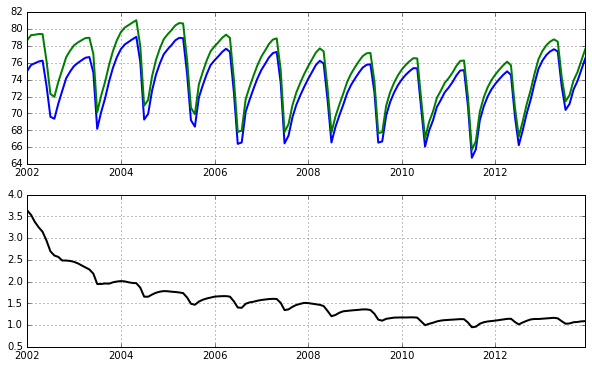

In [11]:
y1 = np.nanmean(Ba1[:, Class_interp==1], 1)
y2 = np.nanmean(Ba2[:, Class_interp==1], 1)

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

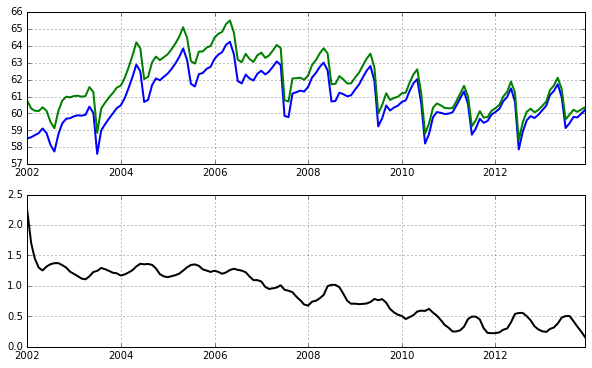

In [29]:
y1 = np.nanmean(Ba1[:, Class_interp==3], 1)
y2 = np.nanmean(Ba2[:, Class_interp==3], 1)
y[2, :] = y2-y1

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

##Beaufort Sea

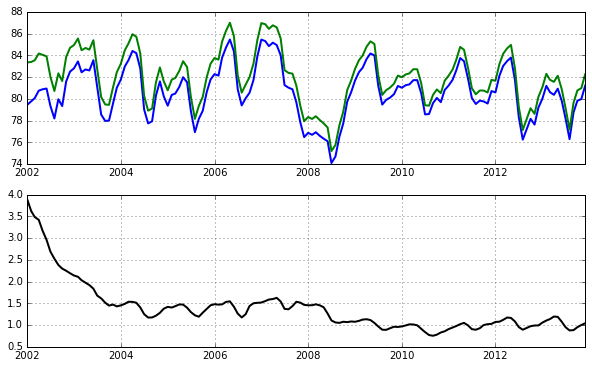

In [30]:
y1 = np.nanmean(Ba1[:, Class_interp==5], 1)
y2 = np.nanmean(Ba2[:, Class_interp==5], 1)
y[3, :] = y2-y1

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

## Chukchi Sea

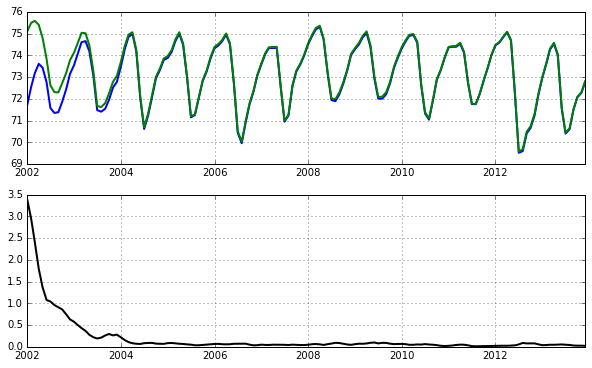

In [31]:
y1 = np.nanmean(Ba1[:, Class_interp==7], 1)
y2 = np.nanmean(Ba2[:, Class_interp==7], 1)
y[4, :] = y2-y1

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

## East Siberian Sea (Kolyma)

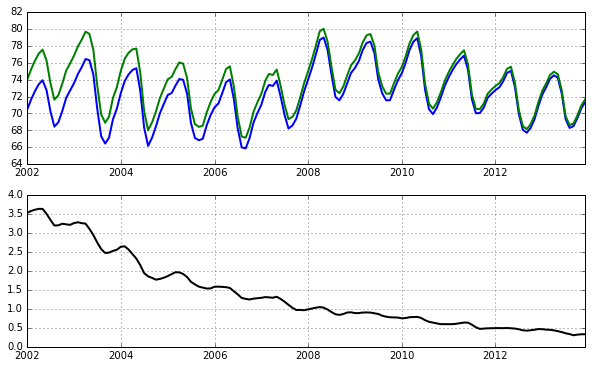

In [32]:
y1 = np.nanmean(Ba1[:, Class_interp==8], 1)
y2 = np.nanmean(Ba2[:, Class_interp==8], 1)
y[5, :] = y2-y1


fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

## Kara Sea (Lena)

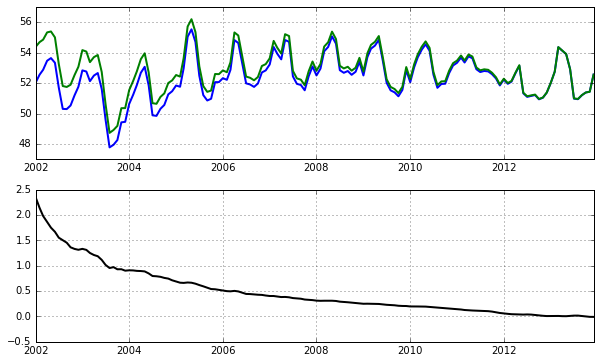

In [33]:
y1 = np.nanmean(Ba1[:, Class_interp==12], 1)
y2 = np.nanmean(Ba2[:, Class_interp==12], 1)
y[6, :] = y2-y1

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

## Laptev Sea (Ob, Yenisey)

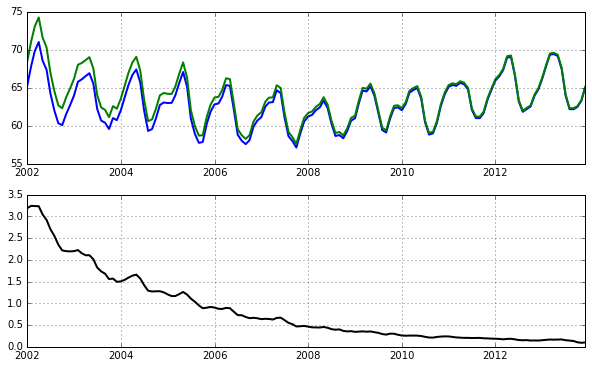

In [34]:
y1 = np.nanmean(Ba1[:, Class_interp==13], 1)
y2 = np.nanmean(Ba2[:, Class_interp==13], 1)
y[7, :] = y2-y1


fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

## South Greenland Sea

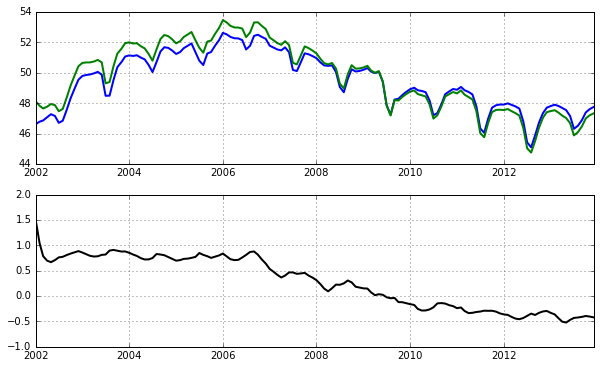

In [18]:
y1 = np.nanmean(Ba1[:, Class_interp==17], 1)
y2 = np.nanmean(Ba2[:, Class_interp==17], 1)

fig = plt.figure(figsize=(10, 6)); 
ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
ax1.grid(); ax2.grid()
ax1.plot(date_list, y1, lw=2)
ax1.plot(date_list, y2, lw=2)
ax2.plot(date_list, y2-y1, 'k-', lw=2)

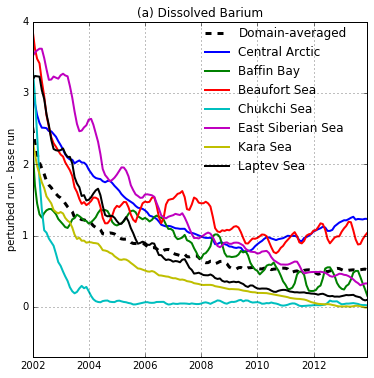

In [64]:
labels = ["Domain-averaged", "Central Arctic", "Baffin Bay", "Beaufort Sea", "Chukchi Sea", "East Siberian Sea", "Kara Sea", "Laptev Sea"]

fig = plt.figure(figsize=(6, 6)); ax = fig.gca(); ax.grid()
ax.plot(date_list, y[0, :].T, 'k--', lw=3, label="Domain-averaged")
for i in range(1, 8):
    ax.plot(date_list, y[i, :].T, lw=2, label=labels[i])

LG = ax.legend(numpoints=1, bbox_to_anchor=(0.5, 1), loc=2, borderaxespad=0.); LG.draw_frame(False)    

ax.set_ylabel('perturbed run - base run')
ax.set_ylim([-0.7, 4])
ax.set_title('(a) Dissolved Barium')
#fig.savefig('_publish/FIG15_1.pdf', dpi=400, orientation='portrait', papertype='a4', format='pdf',
#                bbox_inches='tight', pad_inches=0.1)

# Result in depth

In [19]:
lnum=[5, 10, 20, 30]
Ba_dep1 = np.squeeze(ptrc_obj1.variables['Ba'][:, lnum, :, :]); Ba_dep1[Ba_dep1==0]=np.nan
Ba_dep2 = np.squeeze(ptrc_obj2.variables['Ba'][:, lnum, :, :]); Ba_dep2[Ba_dep2==0]=np.nan

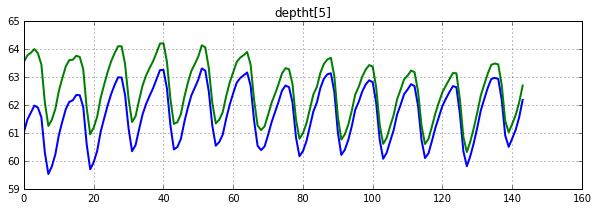

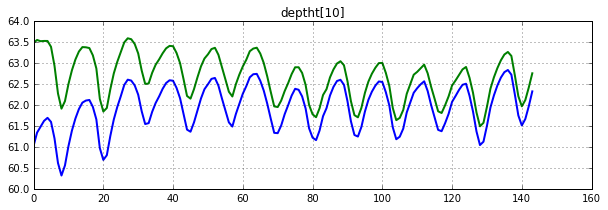

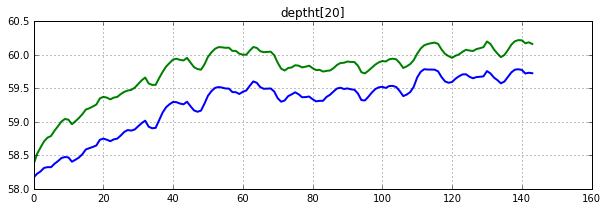

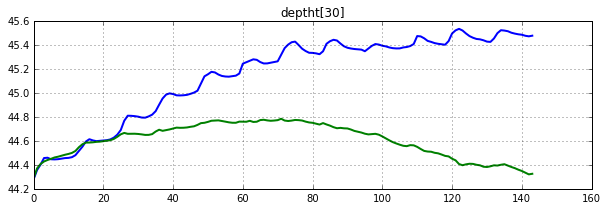

In [21]:
for i in range(4):
    fig = plt.figure(figsize=(10, 3)); 
    ax1 = fig.gca()
    #ax1 = plt.subplot2grid((2, 1), (0, 0), colspan=1, rowspan=1)
    #ax2 = plt.subplot2grid((2, 1), (1, 0), colspan=1, rowspan=2)
    ax1.grid(); ax2.grid()
    ax1.plot(np.nanmean(np.nanmean(Ba_dep1[:, i, :, :], 1), 1), lw=2)
    ax1.plot(np.nanmean(np.nanmean(Ba_dep2[:, i, :, :], 1), 1), lw=2)
    #ax2.plot(np.nanmean(np.nanmean(Ba_dep1[:, i, :, :], 1), 1)-np.nanmean(np.nanmean(Ba_dep2[:, i, :, :], 1), 1), 'k-', lw=2)
    ax1.set_title('deptht['+str(lnum[i])+']')

In [79]:
lev1 = np.arange(35, 95, 5)
def base_vs_perturbe(date_list, Ba1, Ba2, time):
    
    fig=plt.figure(figsize=(15, 15));
    
    ax1 = plt.subplot2grid((1, 2), (0, 0), colspan=1, rowspan=1)
    ax2 = plt.subplot2grid((1, 2), (0, 1), colspan=1, rowspan=1)
    #ax = fig.gca()
    
    proj=Basemap(projection='npstere', resolution='l', boundinglat=55, lon_0=90, round=True, ax=ax1)
    proj.drawmeridians(np.arange(0, 360, 60), labels=[1, 1, 1, 1], fontsize=10, latmax=90,linewidth=0)
    proj.fillcontinents(color=[0.5, 0.5, 0.5], lake_color=None)
    proj.drawcoastlines(linewidth=1.5, color='k')
    x, y=proj(nav_lon, nav_lat)
    CS=proj.contourf(x, y, Ba1[time, :, :], lev1, cmap=cm.GMT_haxby_r, extend='both')
    proj.contour(x, y, Ba1[time, :, :], lev1, linewidths=0.5, colors=('gray',))
    ax1.set_title('Base run '+date_list[time].strftime("%Y-%m"))

    proj=Basemap(projection='npstere', resolution='l', boundinglat=55, lon_0=90, round=True, ax=ax2)
    proj.drawmeridians(np.arange(0, 360, 60), labels=[1, 1, 1, 1], fontsize=10, latmax=90,linewidth=0)
    proj.fillcontinents(color=[0.5, 0.5, 0.5], lake_color=None)
    proj.drawcoastlines(linewidth=1.5, color='k')
    x, y=proj(nav_lon, nav_lat)
    CS=proj.contourf(x, y, Ba2[time, :, :], lev1, cmap=cm.GMT_haxby_r, extend='both')
    proj.contour(x, y, Ba2[time, :, :], lev1, linewidths=0.5, colors=('gray',))
    ax2.set_title('Perturbed run '+date_list[time].strftime("%Y-%m"))
    return fig, ax, CS

In [80]:
lev2 = [-4.25, -3.25, -2.25, -1.25, -0.25, 0.25, 1.25, 2.25, 3.25, 4.25]
def cal_diff(date_list, Ba1, Ba2, time):
    
    fig=plt.figure(figsize=(8, 8));
    ax1 = fig.gca()
    
    proj=Basemap(projection='npstere', resolution='l', boundinglat=55, lon_0=90, round=True, ax=ax1)
    proj.drawmeridians(np.arange(0, 360, 60), labels=[1, 1, 1, 1], fontsize=10, latmax=90,linewidth=0)
    proj.fillcontinents(color=[0.5, 0.5, 0.5], lake_color=None)
    proj.drawcoastlines(linewidth=1.5, color='k')
    x, y=proj(nav_lon, nav_lat)
    CS=proj.contourf(x, y, (Ba2[time, :, :]-Ba1[time, :, :])/Ba1[time, :, :]*100, lev2, cmap=plt.cm.RdBu_r, extend='both')
    proj.contour(x, y, (Ba2[time, :, :]-Ba1[time, :, :])/Ba1[time, :, :]*100, lev2, linewidths=0.5, colors=('gray',))
    ax1.set_title('Perturbed - Base | '+date_list[time].strftime("%Y-%m"))
    return fig, ax, CS

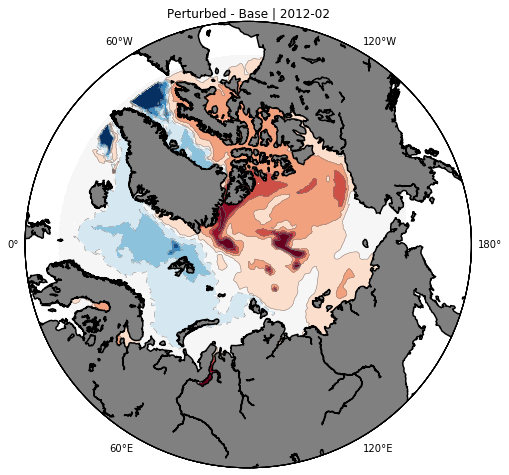

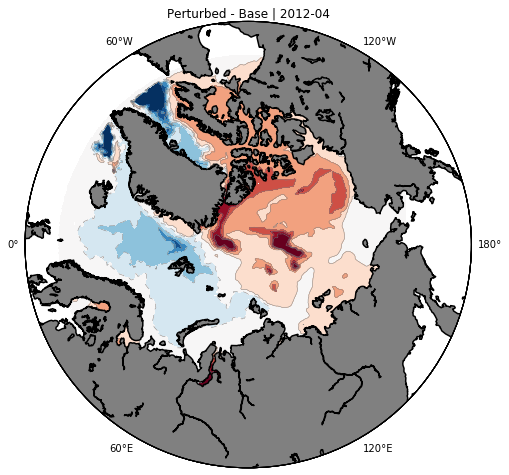

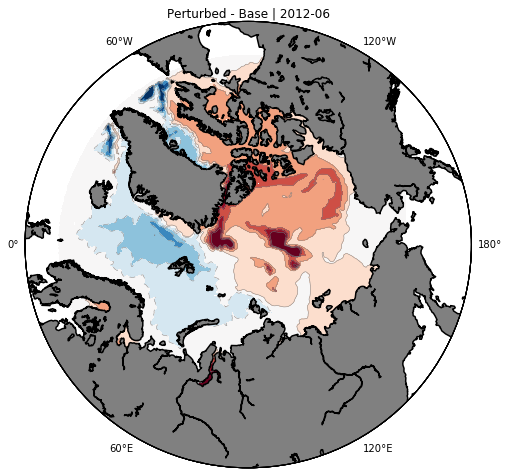

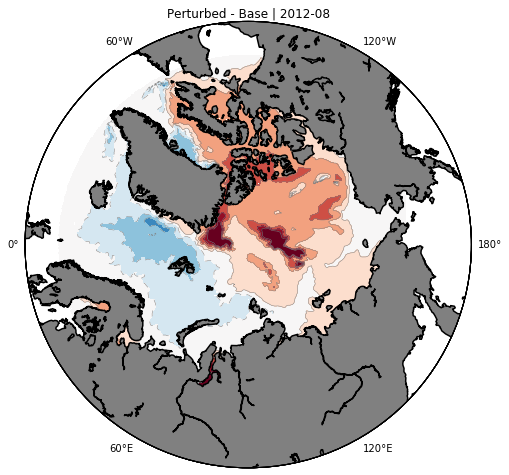

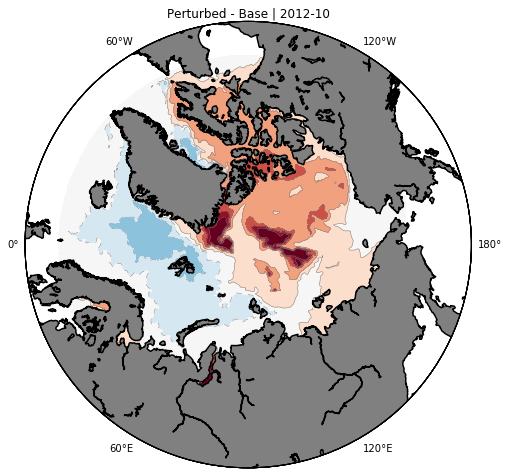

...

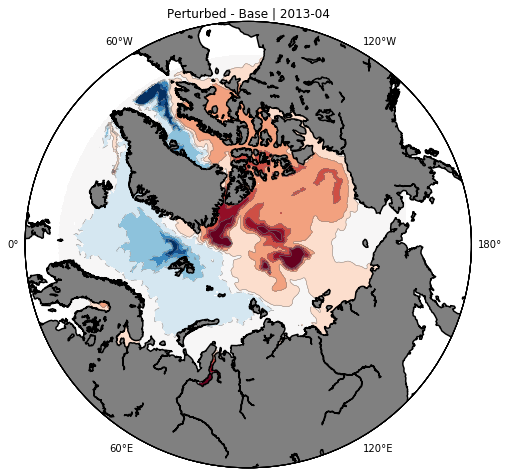

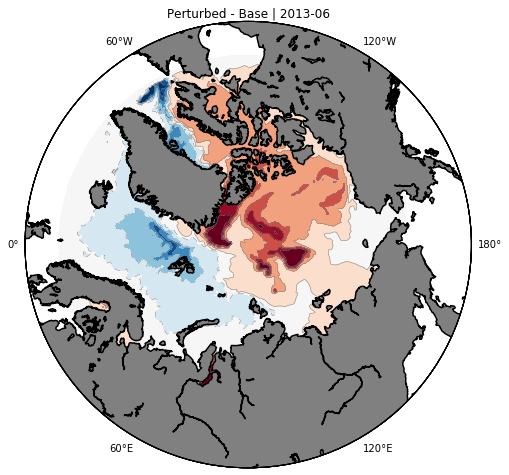

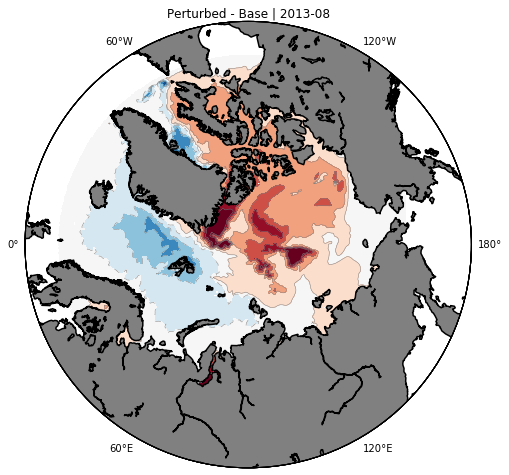

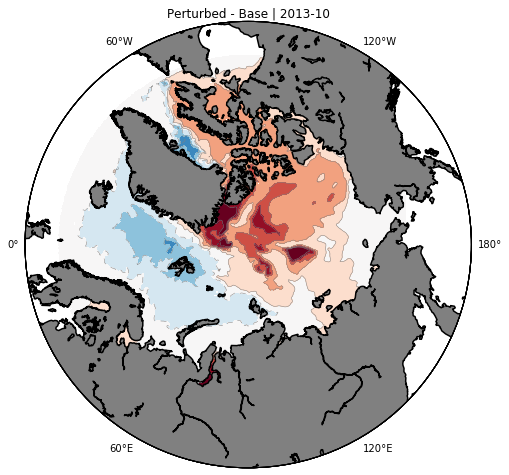

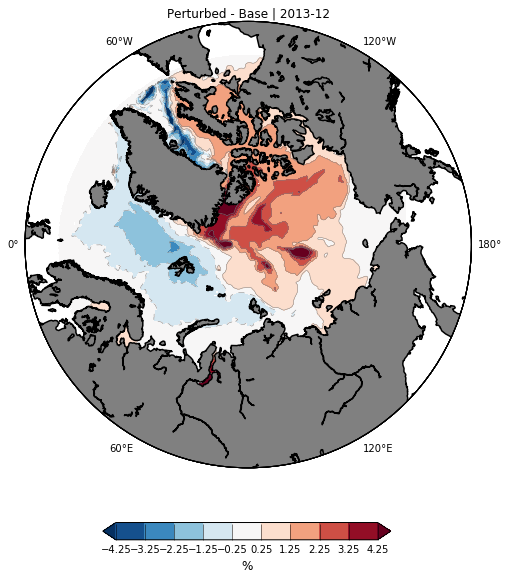

In [103]:
for i in range(12*10+1, 144, 2):
    fig, ax, CS = cal_diff(date_list, Ba1, Ba2, i)
cax = fig.add_axes([0.26, 0, 0.5, 0.030])
CBar = fig.colorbar(CS, cax=cax, orientation='horizontal')
CBar.set_label('%', fontsize=12)
CBar.ax.tick_params(axis='x', length=16)
CBar.set_ticks(lev2)

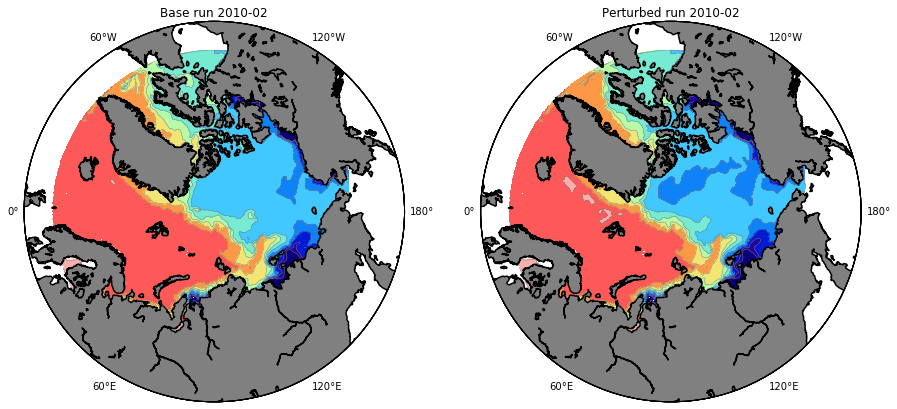

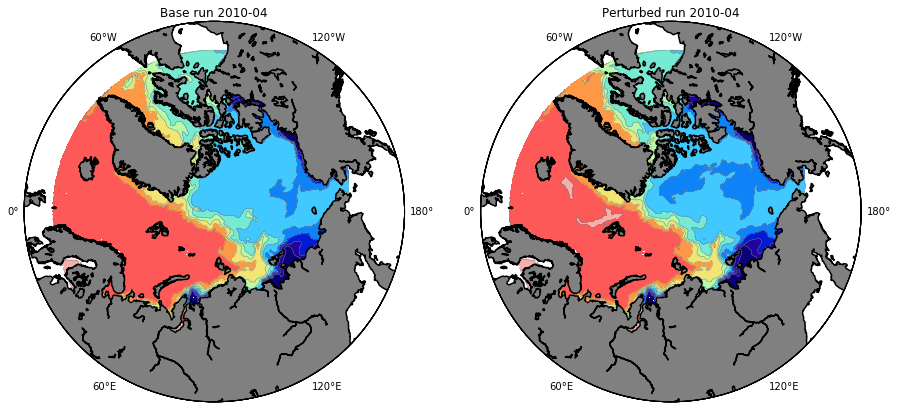

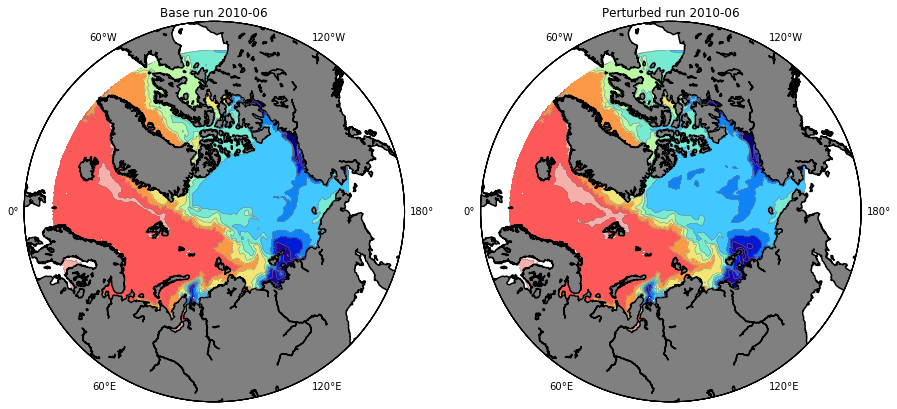

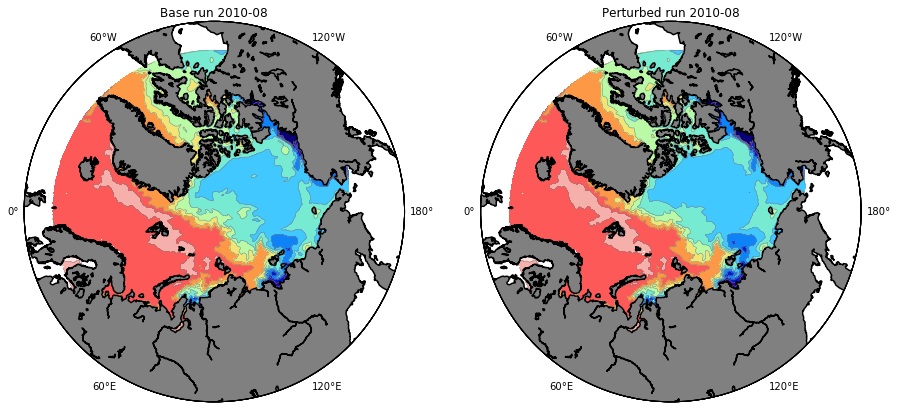

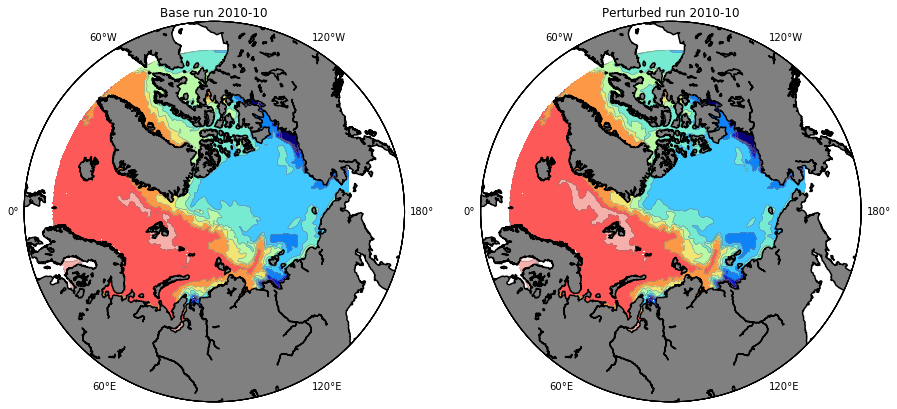

...

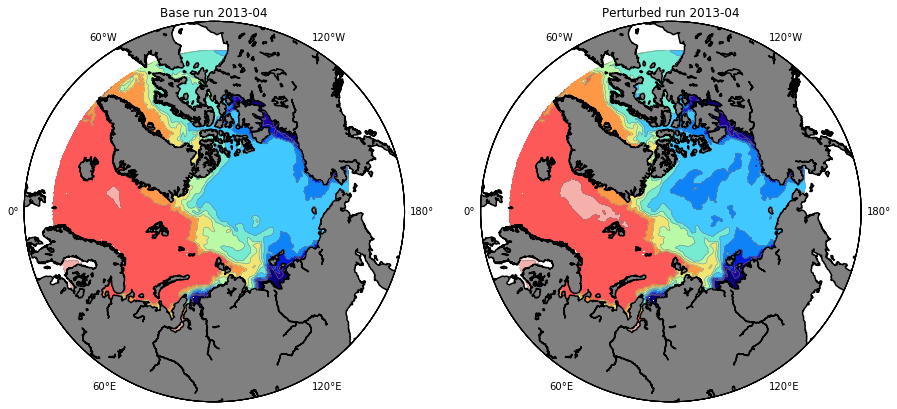

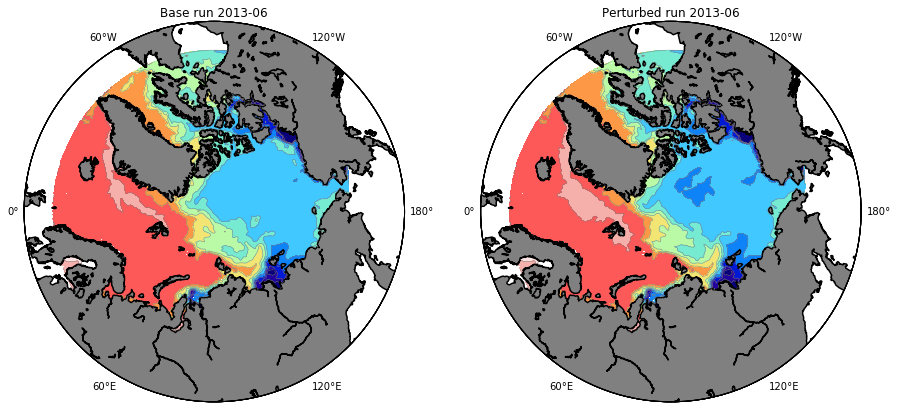

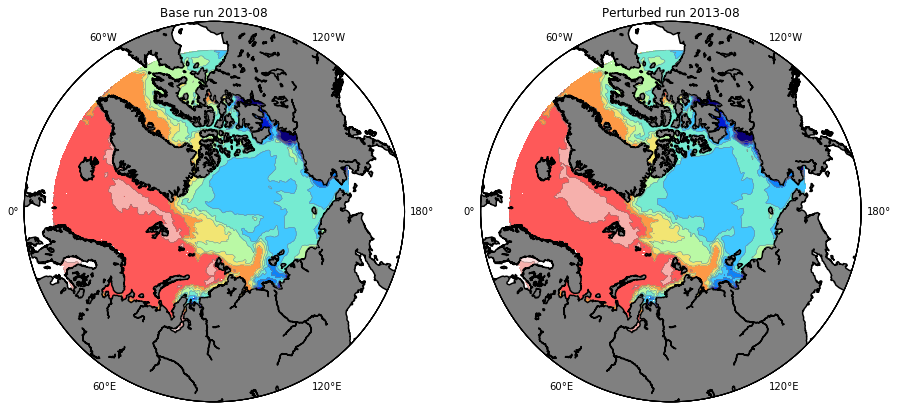

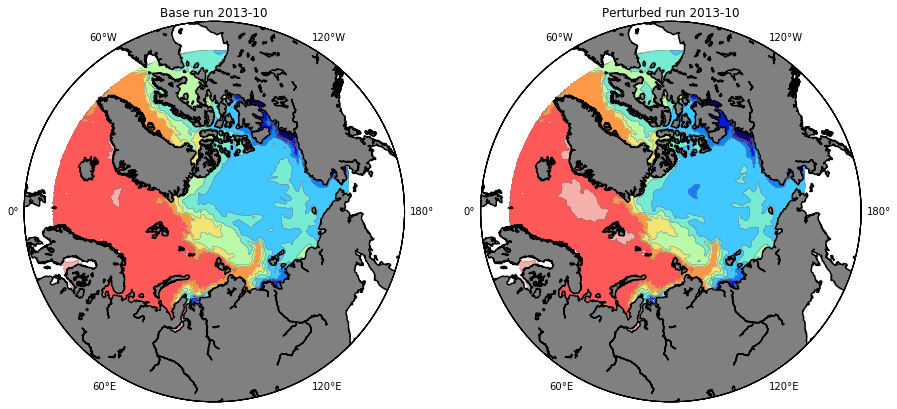

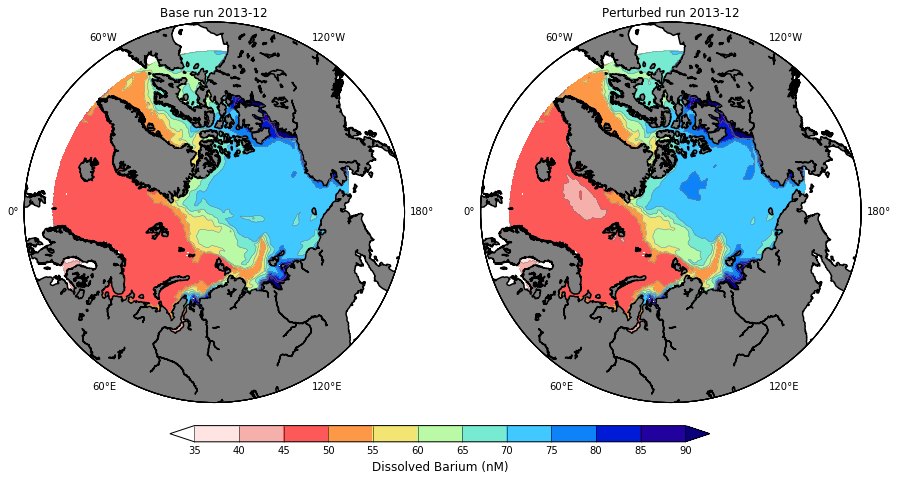

In [82]:
for i in range(12*8+1, 144, 2):
    fig, ax, CS = base_vs_perturbe(date_list, Ba1, Ba2, i)
    
cax = fig.add_axes([0.26, 0.3, 0.5, 0.015])
CBar = fig.colorbar(CS, cax=cax, orientation='horizontal')
CBar.set_label('Dissolved Barium (nM)', fontsize=12)
CBar.ax.tick_params(axis='x', length=16)
CBar.set_ticks(lev1)